<h1><center>Laboratorio 6: El Pandas no Muerde (act IV) 🐼</center></h1>

<center><strong>MDS7202: Laboratorio de Programación Científica para Ciencia de Datos</strong></center>

### Cuerpo Docente:

- Profesores: Pablo Badilla, Ignacio Meza
- Auxiliar: Sebastián Tinoco
- Ayudante: Felipe Arias, Diego Cortez

### Equipo: SUPER IMPORTANTE - notebooks sin nombre no serán revisados

- Nombre de alumno 1: Javier Santidrián Salas
- Nombre de alumno 2: Patricio Yáñez Alarcón


### **Link de repositorio de GitHub:** https://github.com/jsantidrian/labs-Santidrian-Yanez


## Reglas:

- **Grupos de 2 personas**
- Asistencia **obligatoria** a instrucciones del lab (viernes 16.15). Luego, pueden quedarse trabajando en las salas o irse.
- **No se revisarán entregas de personas ausentes**. 
- Cualquier duda fuera del horario de clases al foro. Mensajes al equipo docente serán respondidos por este medio.
- Prohibidas las copias. 
- Pueden usar cualquer matrial del curso que estimen conveniente.

### Objetivos principales del laboratorio

- Aplicar los paradigmas y buenas prácticas de programación vistas hasta este momento.
- Comprender y aprovechar las ventajas que nos ofrece la liberia `numpy` con respecto a trabajar en Python 'puro'.
- Visualizar aplicaciones de filtros de imágenes sin el uso de librerías.
- Verificar que el uso indiscriminado de `for` puede afectar en la eficiencia en al procesar datos masivos.


El laboratorio deberá ser desarrollado sin el uso indiscriminado de iteradores nativos de python (aka "for", "while"). La idea es que aprendan a exprimir al máximo las funciones optimizadas que nos entrega `numpy`, las cuales vale mencionar, son bastante más eficientes que los iteradores nativos sobre arreglos (*o tensores*).

## Descripción del laboratorio.

### Importamos librerias utiles 😸

In [1]:
# Libreria Core del lab.
import numpy as np
!pip install --upgrade pandas
!pip install xlrd
!pip install openpyxl
import pandas as pd
import datetime
from scipy import stats

from IPython.display import display, Markdown, Latex

#Libreria para plotear
!pip install --upgrade plotly
!pip install missingno
import matplotlib.pyplot as plt
import missingno as msno
import plotly.express as px

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Segmentación de Clientes en Tienda de Retail 🛍️

<p align="center">
  <img width=300 src="https://s1.eestatic.com/2018/04/14/social/la_jungla_-_social_299733421_73842361_854x640.jpg">
</p>

## 1.1 Cargar Dataset

Mr. Lepin Mora quien es el gerente de una cotizada tienda de retail en Europa, les solicita si pueden analizar los datos de algunas de sus tiendas.

Para esto, el área de ventas les entrega el archivo `online_retail_II.pickle` con el que se les pide que cargue y visualicen algunas de las filas que componen el Dataset.

Realice una primera visualización de los datos y señale los atributos que componen el dataset. Señale las columnas que conforman el dataset, el tipo de variable presente en cada columna y comente que representa cada una de estas.

**Respuesta:**

In [3]:
df_retail = pd.read_pickle("/content/drive/My Drive/U/11 Semestre/Lab Progra/Labs/Lab 6/online_retail_II.pickle")
df_retail = df_retail.astype(
    {
        "Invoice": "category",
        "StockCode": "category",
        "Description": str,
        "Customer ID": "category",
    }
)
df_retail.head()

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom


Vemos la información del dataset:

In [4]:
df_retail.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 525461 entries, 0 to 525460
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   Invoice      525461 non-null  category      
 1   StockCode    525461 non-null  category      
 2   Description  525461 non-null  object        
 3   Quantity     525461 non-null  int64         
 4   InvoiceDate  525461 non-null  datetime64[ns]
 5   Price        525461 non-null  float64       
 6   Customer ID  417534 non-null  category      
 7   Country      525461 non-null  object        
dtypes: category(3), datetime64[ns](1), float64(1), int64(1), object(2)
memory usage: 24.6+ MB


El dataset de retail tiene 525.461 datos (filas) y está compuesto de 8 atributos (columnas), los cuales son:

- **Invoice (category)**: Código asignado a cada transacción.

- **StockCode (category)**: Código del producto en transacción.

- **Description (str)**: Nombre del producto en transacción.

- **Quantity (int)**: Cantidades vendidas del producto en transacción.

- **InvoiceDate (datetime)**: Fecha y hora de la transacción.

- **Price (float)**: Precio unitario del producto en transacción.

- **Customer ID (category)**: ID asignado a cada cliente en transacción.

- **Country (str)**: Nombre del país donde reside el cliente en transacción.

## 1.2 Analisís Explotatorio de los Datos [0.5 puntos] 

En base a la primera visualización del dataset, *Don Mora* le solicita que realicen un análisis exploratorio de los datos, para esto les deberán realizar un análisis univariado y multivariado. De la revisión, ustedes deben explicar potenciales anomalías visualizadas y señalar si existe la necesidad de realizar una limpieza de datos.

Explique a que nos referimos con análisis univariable, multivariable y de datos faltantes. ¿Qué beneficios nos otorga estudiar estos datos?. Sea conciso con su respuesta y no escriba mas de 5 líneas para su respuesta.

**Respuesta a la Pregunta:**

En un dataset, el análisis univariable consiste en estudiar cada variable de forma individual para examinar su distribución, tendencias y valores atípicos. El análisis multivariable estudia relaciones entre pares de variables mediante por ejemplo gráficos de dispersión o correlaciones. Los datos faltantes son todas aquellas entradas del dataset (vista como una matriz tabular) que no tienen información. Esto se puede estudiar por filas (es decir, ver por cada dato si es que hay valores faltantes en alguna de sus variables) o por columnas (es decir, ver por cada variable la cantidad de datos que tienen valores faltantes en esa entrada). Estudiar estos datos es muy importante para evitar sesgos en el análisis.


### 1.2.1 Análisis Univariado [2 Puntos]

A continuación, se le presentan dos funciones para analizar los datos que componen un dataframe. La primera de estas es la función ``profile_serie()`` la cual recibe una serie y le entrega un análisis detallado de los datos que conforman dicha serie. 

Ejecute la funcion ``profile_serie()`` sobre cada serie para realizar un análisis univariado de estas. A continuación, comente acerca de el comportamiento de cada variable según las estadísticas descriptivas y los gráficos generados.

In [5]:
from pandas.api.types import is_numeric_dtype
from pandas.core.dtypes.common import is_datetime_or_timedelta_dtype


def profile_serie(serie_in, n_samples=1000, random_state=42):
    serie = serie_in.copy()

    profile = pd.Series(dtype='object')
    profile["Type"] = serie.dtype
    profile = pd.concat([profile, serie.describe()])

    # profile = pd.Series([])

    if is_numeric_dtype(serie):
        profile["Negative"] = (serie < 0).sum()
        profile["Negative (%)"] = (
            str(round((serie < 0).sum() / len(serie) * 100, 2)) + " %"
        )
        profile["Zeros"] = (serie == 0).sum()
        profile["Zeros (%)"] = (
            str(round((serie == 0).sum() / len(serie) * 100, 2)) + " %"
        )
        profile["Kurt"] = serie.kurt()
        profile["Skew"] = serie.skew()

    profile[" "] = " "  # espacio

    profile["Missing cells"] = serie.isnull().sum()
    profile["Missing cells (%)"] = (
        str(round(serie.isnull().sum() / len(serie) * 100, 2)) + " %"
    )
    profile["Duplicate rows"] = serie.duplicated(False).sum()
    profile["Duplicate rows (%)"] = (
        str(round(serie.duplicated(False).sum() / len(serie) * 100, 2)) + " %"
    )
    profile["Total size in memory"] = str(serie.memory_usage(index=True)) + " bytes"

    # profile = pd.concat([profile, description])

    profile = profile.rename(
        index={
            "count": "Number of observations",
            "mean": "Mean",
            "std": "Std",
            "min": "Min",
            "max": "Max",
            "unique": "Unique",
            "top": "Top",
            "freq": "Freq",
        }
    )
    no_outliers_fig = None

    if is_numeric_dtype(serie):

        sampled_serie = serie.sample(n_samples, random_state=random_state)
        fig = px.histogram(
            sampled_serie, marginal="box", title=f"{serie.name} - With Outliers"
        )

        no_outliers = sampled_serie.loc[(np.abs(stats.zscore(sampled_serie)) < 3)]
        # zscore = https://es.wikipedia.org/wiki/Unidad_tipificada
        
        no_outliers_fig = px.histogram(
            no_outliers, marginal="box", title=f"{serie.name} - Without Outliers"
        )

    elif is_datetime_or_timedelta_dtype(serie):
        sampled_serie = serie.sample(n_samples, random_state=random_state)
        fig = px.histogram(sampled_serie, marginal="box", title=f"{serie.name}")
    
    else:
        count = (
            serie.value_counts()[0:100]
            .reset_index()
            .rename(columns = {'count': 'Count'})
        )
        fig = px.bar(
            x=count[serie.name].astype(str),
            y=count["Count"],
            title=f"100 Most common categories of {serie.name}",
        )
    display(Markdown(f'## {serie.name} Profile'))
    display(profile)
    fig.show()

    if no_outliers_fig:
        no_outliers_fig.show()

    # return fig, profile

Evaluamos la función de análisis univariado en cada serie de nuestro dataframe:

###**Análisis de la serie Price**:###

In [6]:
profile_serie(df_retail['Price']) 

## Price Profile

Type                            float64
Number of observations         525461.0
Mean                           4.688834
Std                          146.126914
Min                           -53594.36
25%                                1.25
50%                                 2.1
75%                                4.21
Max                            25111.09
Negative                              3
Negative (%)                      0.0 %
Zeros                              3687
Zeros (%)                         0.7 %
Kurt                       64868.344873
Skew                        -140.768446
                                       
Missing cells                         0
Missing cells (%)                 0.0 %
Duplicate rows                   524485
Duplicate rows (%)              99.81 %
Total size in memory      4203816 bytes
dtype: object

- El valor mínimo es de -53594.36, lo cual no tiene sentido pues es un valor negativo (recordar que Price denota el precio unitario del producto en transacción), por lo que habrá que eliminar posteriormente los valores negativos para la variable Price en la limpieza de datos. 
- El valor máximo es de 25111.09, lo cual se aleja enormemente del valor de la mediana (50%) que es 2.1 y del tercer cuartil (75%) que es 4.21. Esto indica la presencia de outliers, lo cual se ve reflejado en el gráfico de boxplot arriba del histograma. 
- El valor negativo para Skew (skewness/asimetría) de -140.768446 indica que esta distribución esta desplazada hacia la derecha. Pero notar que esto no se refleja mediante el gráfico, ya que hay una gran presencia de valores extremos que contaminan este valor, por lo que no es representativo.
- El gran valor positivo para Kurt (curtosis) de 64868.344873 nos indica que hay una concentración mayor de datos alrededor de la media
y una cola más pronunciada, lo que indica que hay más valores extremos en la distribución. Esto queda reflejado a través del gráfico de histograma y boxplot.
- No hay presencia de valores nulos.


###**Análisis de la serie Invoice**:###

In [7]:
profile_serie(df_retail['Invoice']) 

## Invoice Profile

Type                           category
Number of observations           525461
Unique                            28816
Top                              537434
Freq                                675
                                       
Missing cells                         0
Missing cells (%)                 0.0 %
Duplicate rows                   517456
Duplicate rows (%)              98.48 %
Total size in memory      2338386 bytes
dtype: object

- Del gráfico se aprecia un conteo de los códigos de transacción más repetidos en orden descendente. Un alto valor para un código (barra más alta) significa que aparece múltiples veces en el dataset, por lo tanto hace referencia a un pedido de varios productos a la vez.
- El código de transacción que más se repite (675 veces) es 537434.
- No hay presencia de valores nulos.

###**Análisis de la serie StockCode**:###

In [8]:
profile_serie(df_retail['StockCode']) 

## StockCode Profile

Type                           category
Number of observations           525461
Unique                             4632
Top                              85123A
Freq                               3516
                                       
Missing cells                         0
Missing cells (%)                 0.0 %
Duplicate rows                   525026
Duplicate rows (%)              99.92 %
Total size in memory      1220242 bytes
dtype: object

- Del gráfico se aprecia un conteo de los códigos de productos más repetidos en transacción en orden descendente. Un alto valor para un código (barra más alta) significa que aparece múltiples veces en el dataset, por lo tanto hace referencia a que es un producto que tiene alta demanda.
- El código de producto que más se repite (3516 veces) es 85123A.
- No hay presencia de valores nulos.

###**Análisis de la serie Description**:###

In [9]:
profile_serie(df_retail['Description']) 

## Description Profile

Type                                                  object
Number of observations                                525461
Unique                                                  4682
Top                       WHITE HANGING HEART T-LIGHT HOLDER
Freq                                                    3549
                                                            
Missing cells                                              0
Missing cells (%)                                      0.0 %
Duplicate rows                                        525198
Duplicate rows (%)                                   99.95 %
Total size in memory                           4203816 bytes
dtype: object

- Del gráfico se aprecia un conteo de los nombres de productos más repetidos en transacción en orden descendente. Un alto valor para un nombre (barra más alta) significa que aparece múltiples veces en el dataset, por lo tanto hace referencia a que ese nombre de producto corresponde a uno que tiene alta demanda.
- El nombre del producto que más se repite (3549 veces) es WHITE HANGING HEART T-LIGHT HOLDER. 
- No hay presencia de valores nulos.

###**Análisis de la serie Quantity**:###

In [10]:
profile_serie(df_retail['Quantity']) 

## Quantity Profile

Type                              int64
Number of observations         525461.0
Mean                          10.337667
Std                           107.42411
Min                             -9600.0
25%                                 1.0
50%                                 3.0
75%                                10.0
Max                             19152.0
Negative                          12326
Negative (%)                     2.35 %
Zeros                                 0
Zeros (%)                         0.0 %
Kurt                        6277.666908
Skew                          36.044617
                                       
Missing cells                         0
Missing cells (%)                 0.0 %
Duplicate rows                   525122
Duplicate rows (%)              99.94 %
Total size in memory      4203816 bytes
dtype: object

- El valor mínimo es de -9600.0, lo cual no tiene sentido pues es un valor negativo (recordar que Quantity denota las cantidades vendidas del producto en transacción), por lo que habrá que eliminar posteriormente los valores negativos para la variable Quantity en la limpieza de datos. 
- El valor máximo es de 19152.0, lo cual se aleja enormemente del valor de la mediana (50%) que es 3.0 y del tercer cuartil (75%) que es 10.0. Esto indica la presencia de outliers, lo cual se ve reflejado en el gráfico de boxplot arriba del histograma. 
- El valor positivo para Skew (skewness/asimetría) de 36.044617 indica que esta distribución esta desplazada hacia la izquierda 
(a pesar de que no se note debido a los valores atípicos encontrados a la derecha, pero cuando se hace zoom cerca de la mediana se aprecia un poco más).
- El valor positivo para Kurt (curtosis) de 6277.666908 nos indica que hay una concentración mayor de datos alrededor de la media
y una cola más pronunciada, lo que indica que hay más valores extremos en la distribución. Esto queda reflejado a través del gráfico de histograma y boxplot.
- No hay presencia de valores nulos.

###**Análisis de la serie InvoiceDate**:###

In [11]:
profile_serie(df_retail['InvoiceDate']) 

## InvoiceDate Profile

Type                                     datetime64[ns]
Number of observations                           525461
Mean                      2010-06-28 11:37:36.845017856
Min                                 2009-12-01 07:45:00
25%                                 2010-03-21 12:20:00
50%                                 2010-07-06 09:51:00
75%                                 2010-10-15 12:45:00
Max                                 2010-12-09 20:01:00
                                                       
Missing cells                                         0
Missing cells (%)                                 0.0 %
Duplicate rows                                   520400
Duplicate rows (%)                              99.04 %
Total size in memory                      4203816 bytes
dtype: object

- Del gráfico se aprecia un histograma y boxplot que muestra la cantidad de transacciones hechas en el período Nov 22, 2019-Dec 18, 2010.
- La menor cantidad de transacciones fue hecha en 2009-12-01 07:45:00 (min) y la mayor en 2010-12-09 20:01:00 (max).
- Se aprecia que la cantidad de transacciones es relativamente simétrica en el tiempo, ya que la mediana (50%) se encuentra en 2010-07-06 09:51:00 (Junio de 2010) que es aproximadamente la mitad del período considerado.
- No hay presencia de valores nulos.

###**Análisis de la serie Customer ID**:###

In [12]:
profile_serie(df_retail['Customer ID']) 

## Customer ID Profile

Type                           category
Number of observations         417534.0
Unique                           4383.0
Top                             14911.0
Freq                             5710.0
                                       
Missing cells                    107927
Missing cells (%)               20.54 %
Duplicate rows                   525327
Duplicate rows (%)              99.97 %
Total size in memory      1218250 bytes
dtype: object

- Del gráfico se aprecia un conteo de los ID de clientes más repetidos en transacción en orden descendente. Un alto valor para un ID (barra más alta) significa que aparece múltiples veces en el dataset, por lo tanto hace referencia a que ese cliente respectivo corresponde a uno regular.
- El ID de cliente más repetido (5710 veces) es 14911.0.
- Hay 107.927 valores nulos, que corresponde a un 20.54 % del total de datos, por lo que habrá que eliminarlos posteriormente del dataset en la sección de limpieza de datos.

###**Análisis de la serie Country**:###

In [13]:
profile_serie(df_retail['Country']) 

## Country Profile

Type                              object
Number of observations            525461
Unique                                40
Top                       United Kingdom
Freq                              485852
                                        
Missing cells                          0
Missing cells (%)                  0.0 %
Duplicate rows                    525461
Duplicate rows (%)               100.0 %
Total size in memory       4203816 bytes
dtype: object

- Del gráfico se aprecia un conteo de los países de los clientes más repetidos en transacción en orden descendente. Un alto valor para un país(barra más alta) significa que aparece múltiples veces en el dataset, por lo tanto hace referencia a que ese país de clientes es uno regular.
- El país más repetido para los clientes (485.852 veces) es United Kingdom.
- No hay presencia de valores nulos.

### 1.2.2 Análisis Multivariado y Datos Faltantes [1 ptos]

En segundo lugar encontrará la función ``profile_df()`` que recibe un dataframe como entrada y realiza un análisis bivariado de todas las variables numéricas que conforman el dataframe, un analisis de la correlación de Pearson entre las variables numericas del dataframe y la matriz de datos faltantes.

In [14]:
def profile_df(dataframe_in):
    df = dataframe_in.copy()

    list_type = []
    for col in list(df.columns):
        if is_numeric_dtype(df[col]) or \
        pd.core.dtypes.common.is_datetime_or_timedelta_dtype(df[col]):
            list_type.append(col)

    
    display(Markdown('## Bivariant Analysis:'))
    for i in range(len(list_type)):
        for j in range(i+1, len(list_type)):
            plt.scatter(df[list_type[i]], df[list_type[j]])
            plt.xlabel(list_type[i]) 
            plt.ylabel(list_type[j]) 
            plt.title(f"{list_type[i]} v/s {list_type[j]}")
            plt.show()

    display(Markdown('## Correlation:'))
    fig_corr = px.imshow(df[list_type].corr())
    fig_corr.show()

    display(Markdown('## Missing Matrix:'))
    fig, ax = plt.subplots(figsize=[15, 10])
    msno.matrix(df, ax=ax, sparkline=False)

Evaluamos la función de análisis bivariado de variables numéricas y de datos faltantes en nuestro dataframe:

## Bivariant Analysis:

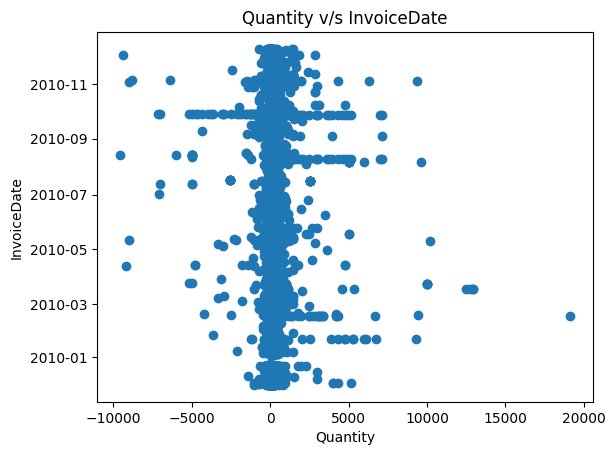

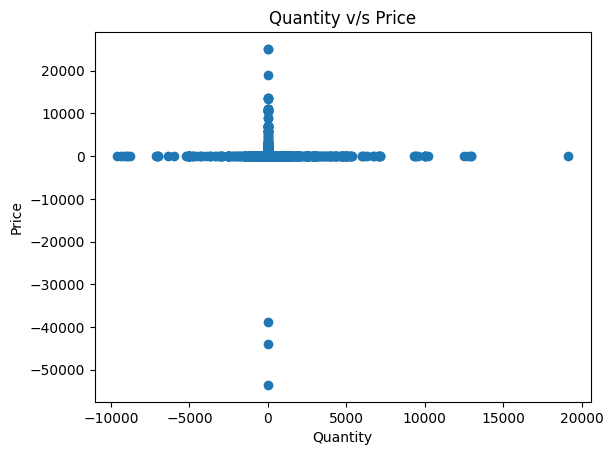

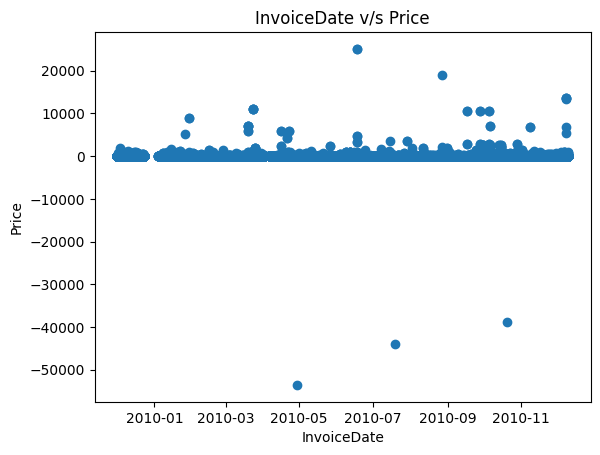

## Correlation:

## Missing Matrix:

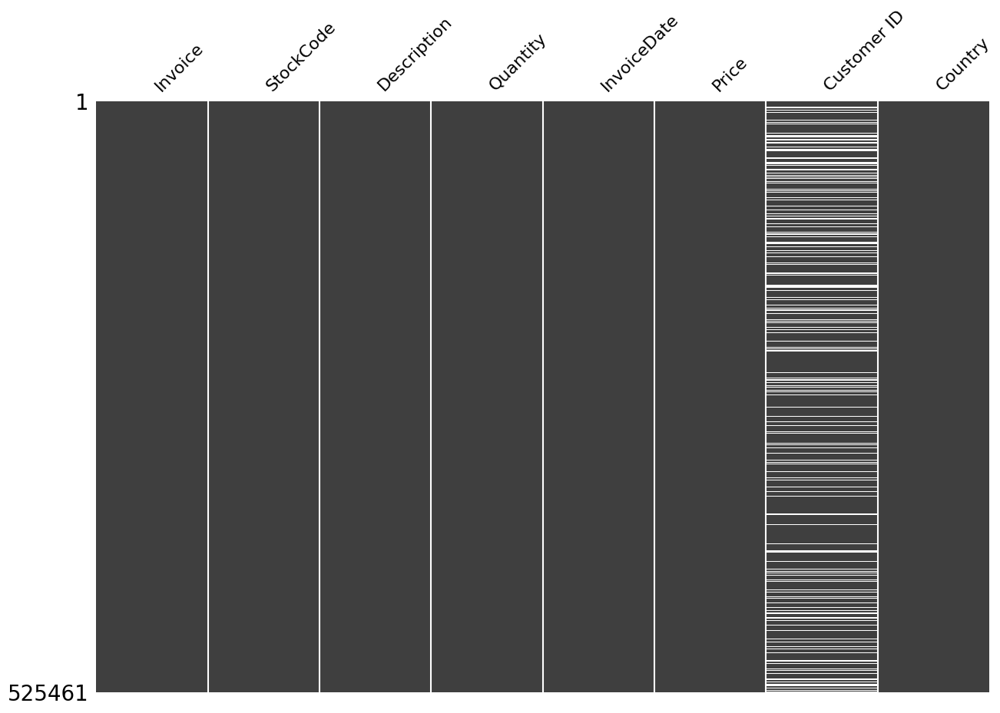

In [15]:
profile_df(df_retail)

###**Análisis Bivariado (variables numéricas)**:###

- **Quantity v/s InvoiceDate:** Se aprecia que a medida que avanza el tiempo (InvoiceDate) la cantidad de productos pedidos por transacción (Quantity) se acumulan cerca de la vertical x = 0. Nuevamente hay problemas con este análisis pues hay valores para Quantity a la izquierda de este eje (lo cual no tiene sentido pues no pueden haber valores negativos para quantity), y además se aprecia la cantidad de outliers que están separados de esta región de alta densidad. 
- **Quantity v/s Price:** Se aprecia que hay valores negativos tanto para Quantity como para Price, lo cual hay que arreglar limpiando la data posteriormente. Además, cuando Price tiene un valor cercano a 0, los valores para quantity se escapan hacia cualquier lado (hacia la izquierda y derecha por la recta y = 0), lo cual refleja los problemas que hay de ingreso de datos en este dataset (y que debemos arreglar).
- **InvoiceDate v/s Price:** Nuevamente hay harta densidad a lo largo del eje y = 0, es decir, la mayor parte de transacciones fueron hechas para precios cercanos a 0 en el tiempo. Por supuesto se aprecian outliers, tanto para abajo del eje y = 0 (valores de Price negativos a arreglar) como para arriba (valores de Price muy grandes). 

###**Análisis de Correlación de Pearson (variables numéricas)**:###

- Se aprecia de la matriz de correlación de Pearson que las variables Quantity, InvoiceDate y Price no tienen una relación lineal (pues tienen valores cercanos a 0).

###**Análisis de Matriz de Datos Faltantes**:###

- De la nullity matrix se aprecia, tal cual como fue comprobado en la parte del análisis univariado, que la única variable que tiene valores nulos es *Customer ID* (donde se aprecian con líneas blancas en la matriz aquellos valores faltantes), por lo que en la sección de limpieza de datos tendremos que eliminar esos datos correspondientes.

### 1.2.3 Limpieza de Datos [1 pto]

Como pudo ver en las secciones anteriores, los datos presentan valores erroneos, es por esto que se le solicita que realice una función que permita limpiar el dataset. Realice esta función en base observaciones propias y considere como imposible tener cantidades negativas en las ventas.

Una vez realizada la función, realice nuevamente el análisis exploratorio y comente las principales diferencias.

**Respuesta:**

Primero notamos que hay muchos valores faltantes en la columna Customer ID (se aprecia de la Nullity Matrix hecha en parte anterior). Para ser más específicos contemos la cantidad de nulos:

In [16]:
df_retail.isna().sum()

Invoice             0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
Price               0
Customer ID    107927
Country             0
dtype: int64

Aquí vemos que hay 107.927 nulos de un total de 525.461, es decir un 20% aproximadamente, por lo cual eliminaremos estas filas con datos nulos (no se perderá una cantidad muy grande de datos). También eliminaremos todos los datos (filas) que tienen valores para Price (precio unitario del producto en transacción) negativos o valores para Quantity (cantidades vendidas del producto en transacción) negativos pues no tienen sentido. Todo esto queda capturado en la siguiente función:


In [17]:
def clean_data(dataframe):
  
  # Eliminamos nulos
  df_sin_nulos = dataframe.dropna()
  
  # Eliminamos datos con valores para Price o Quantity negativos
  mask = (df_sin_nulos['Price'] > 0) & (df_sin_nulos['Quantity'] > 0)
  df_limpio = df_sin_nulos[mask]
  
  return df_limpio

Obtenemos el nuevo dataset limpio:

In [18]:
df_limpio = clean_data(df_retail)

Visualizamos dataset:

In [19]:
df_limpio

,Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
0,489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085.0,United Kingdom
1,489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
2,489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085.0,United Kingdom
3,489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085.0,United Kingdom
4,489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085.0,United Kingdom
...,...,...,...,...,...,...,...,...
525456,538171,22271,FELTCRAFT DOLL ROSIE,2,2010-12-09 20:01:00,2.95,17530.0,United Kingdom
525457,538171,22750,FELTCRAFT PRINCESS LOLA DOLL,1,2010-12-09 20:01:00,3.75,17530.0,United Kingdom
525458,538171,22751,FELTCRAFT PRINCESS OLIVIA DOLL,1,2010-12-09 20:01:00,3.75,17530.0,United Kingdom
525459,538171,20970,PINK FLORAL FELTCRAFT SHOULDER BAG,2,2010-12-09 20:01:00,3.75,17530.0,United Kingdom


Hagamos ahora el EDA con el dataset limpio:

###**Análisis Univariado**:###

###**Análisis de la serie Price**:###

In [39]:
profile_serie(df_limpio['Price']) 

## Price Profile

Type                            float64
Number of observations         407664.0
Mean                           3.294438
Std                           34.757965
Min                               0.001
25%                                1.25
50%                                1.95
75%                                3.75
Max                             10953.5
Negative                              0
Negative (%)                      0.0 %
Zeros                                 0
Zeros (%)                         0.0 %
Kurt                       63865.331746
Skew                         235.066862
                                       
Missing cells                         0
Missing cells (%)                 0.0 %
Duplicate rows                   407478
Duplicate rows (%)              99.95 %
Total size in memory      6522624 bytes
dtype: object

- El valor mínimo pasó de -53594.36 a 0.001, lo cual ahora sí tiene sentido pues no es un valor negativo.
- El valor máximo disminuyó de 25111.09 a 10953.5, lo cual significa que eliminamos gran presencia de datos extremos muy alejados de la mediana, lo que hace apreciar mejor la visualización del gráfico.  
- El valor de Skew (skewness/asimetría) pasó de negativo a positivo, lo cual significa ahora que esta distribución esta desplazada hacia la izquierda (con una cola larga hacia la derecha) 
- El valor de Kurt (curtosis) sigue siendo muy positivo al igual que antes, lo cual indica que la concentración de datos sigue siendo mayor alrededor de la media y la cola sigue siendo pronunciada (siguen habiendo valores extremos en la distribución). 
- Notamos que se redujo la media (mean) y la varianza (std).
- No hay presencia de valores nulos.

###**Análisis de la serie Invoice**:###

In [21]:
profile_serie(df_limpio['Invoice']) 

## Invoice Profile

Type                           category
Number of observations           407664
Unique                            19213
Top                              500356
Freq                                270
                                       
Missing cells                         0
Missing cells (%)                 0.0 %
Duplicate rows                   405936
Duplicate rows (%)              99.58 %
Total size in memory      5363976 bytes
dtype: object

- Cambiaron naturalmente la cantidad de valores, pero la distribución sigue siendo parecida.
- No hay valores nulos.

###**Análisis de la serie StockCode**:###

In [22]:
profile_serie(df_limpio['StockCode']) 

## StockCode Profile

Type                           category
Number of observations           407664
Unique                             4017
Top                              85123A
Freq                               3153
                                       
Missing cells                         0
Missing cells (%)                 0.0 %
Duplicate rows                   407506
Duplicate rows (%)              99.96 %
Total size in memory      4245832 bytes
dtype: object

- Cambiaron naturalmente la cantidad de valores, pero la distribución sigue siendo parecida.
- No hay presencia de valores nulos.

###**Análisis de la serie Description**:###

In [23]:
profile_serie(df_limpio['Description']) 

## Description Profile

Type                                                  object
Number of observations                                407664
Unique                                                  4444
Top                       WHITE HANGING HEART T-LIGHT HOLDER
Freq                                                    3153
                                                            
Missing cells                                              0
Missing cells (%)                                      0.0 %
Duplicate rows                                        407462
Duplicate rows (%)                                   99.95 %
Total size in memory                           6522624 bytes
dtype: object

- Cambiaron naturalmente la cantidad de valores, pero la distribución sigue siendo parecida.
- No hay presencia de valores nulos.

###**Análisis de la serie Quantity**:###

In [24]:
profile_serie(df_limpio['Quantity']) 

## Quantity Profile

Type                              int64
Number of observations         407664.0
Mean                          13.585585
Std                           96.840747
Min                                 1.0
25%                                 2.0
50%                                 5.0
75%                                12.0
Max                             19152.0
Negative                              0
Negative (%)                      0.0 %
Zeros                                 0
Zeros (%)                         0.0 %
Kurt                        9572.064923
Skew                          79.917702
                                       
Missing cells                         0
Missing cells (%)                 0.0 %
Duplicate rows                   407550
Duplicate rows (%)              99.97 %
Total size in memory      6522624 bytes
dtype: object

- El valor mínimo pasó de -9600.0 a 1.0, lo cual ahora sí tiene sentido pues no es un valor negativo.
- El valor máximo se mantuvo igual.
- El valor de Skew (skewness/asimetría) incrementó positivamente un poco a 79.908612, lo cual sigue significando que esta distribución esta desplazada hacia la izquierda (con una cola larga hacia la derecha) 
- El valor de Kurt (curtosis) incrementó positivamente a 9570.751621, lo cual sigue indicando que la concentración de datos es mayor alrededor de la media y la cola es pronunciada (siguen habiendo valores extremos en la distribución). 
- Notamos que la media (mean) incrementó un poco y la varianza (std) 
 también disminuyó un poco.
- No hay presencia de valores nulos.

###**Análisis de la serie InvoiceDate**:###

In [25]:
profile_serie(df_limpio['InvoiceDate']) 

## InvoiceDate Profile

Type                                     datetime64[ns]
Number of observations                           407664
Mean                      2010-07-01 10:15:11.871688192
Min                                 2009-12-01 07:45:00
25%                                 2010-03-26 14:01:00
50%                                 2010-07-09 15:47:00
75%                                 2010-10-14 17:09:00
Max                                 2010-12-09 20:01:00
                                                       
Missing cells                                         0
Missing cells (%)                                 0.0 %
Duplicate rows                                   406199
Duplicate rows (%)                              99.64 %
Total size in memory                      6522624 bytes
dtype: object

- Cambiaron naturalmente la cantidad de valores, pero la distribución sigue siendo parecida.
- No hay presencia de valores nulos.

###**Análisis de la serie Customer ID**:###

In [26]:
profile_serie(df_limpio['Customer ID']) 

## Customer ID Profile

Type                           category
Number of observations         407664.0
Unique                           4312.0
Top                             14911.0
Freq                             5570.0
                                       
Missing cells                         0
Missing cells (%)                 0.0 %
Duplicate rows                   407573
Duplicate rows (%)              99.98 %
Total size in memory      4243840 bytes
dtype: object

- Cambiaron naturalmente la cantidad de valores, pero la distribución sigue siendo parecida.
- No hay presencia de valores nulos.

###**Análisis de la serie Country**:###

In [27]:
profile_serie(df_limpio['Country']) 

## Country Profile

Type                              object
Number of observations            407664
Unique                                37
Top                       United Kingdom
Freq                              370929
                                        
Missing cells                          0
Missing cells (%)                  0.0 %
Duplicate rows                    407664
Duplicate rows (%)               100.0 %
Total size in memory       6522624 bytes
dtype: object

- Cambiaron naturalmente la cantidad de valores, pero la distribución sigue siendo parecida.
- No hay presencia de valores nulos.

###**Análisis Multivariado y Datos Faltantes**:###

## Bivariant Analysis:

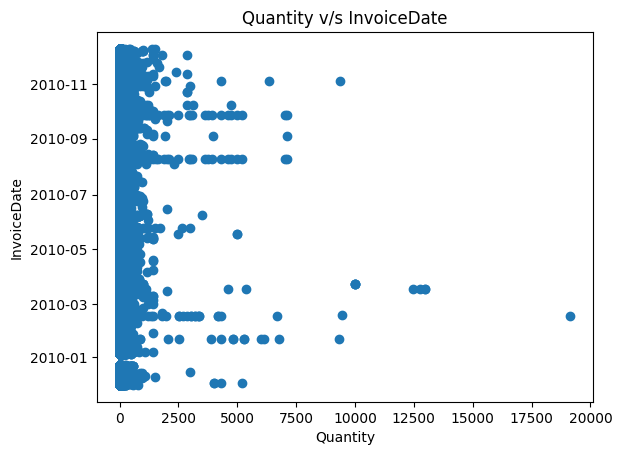

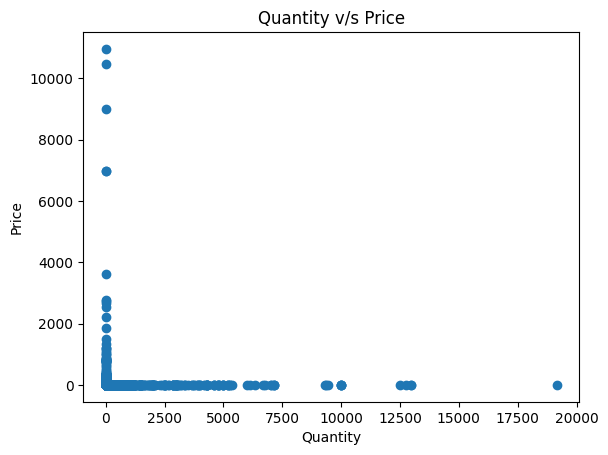

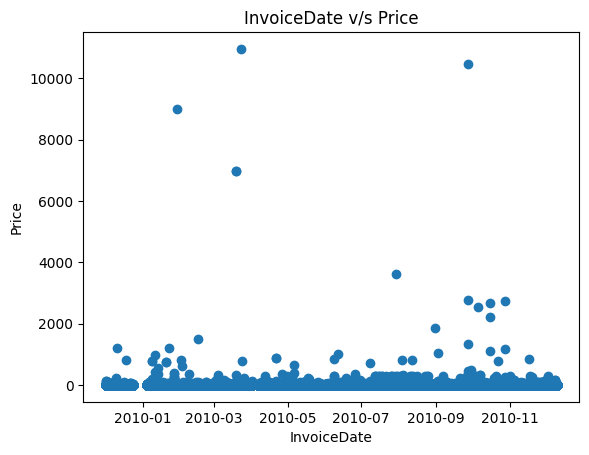

## Correlation:

## Missing Matrix:

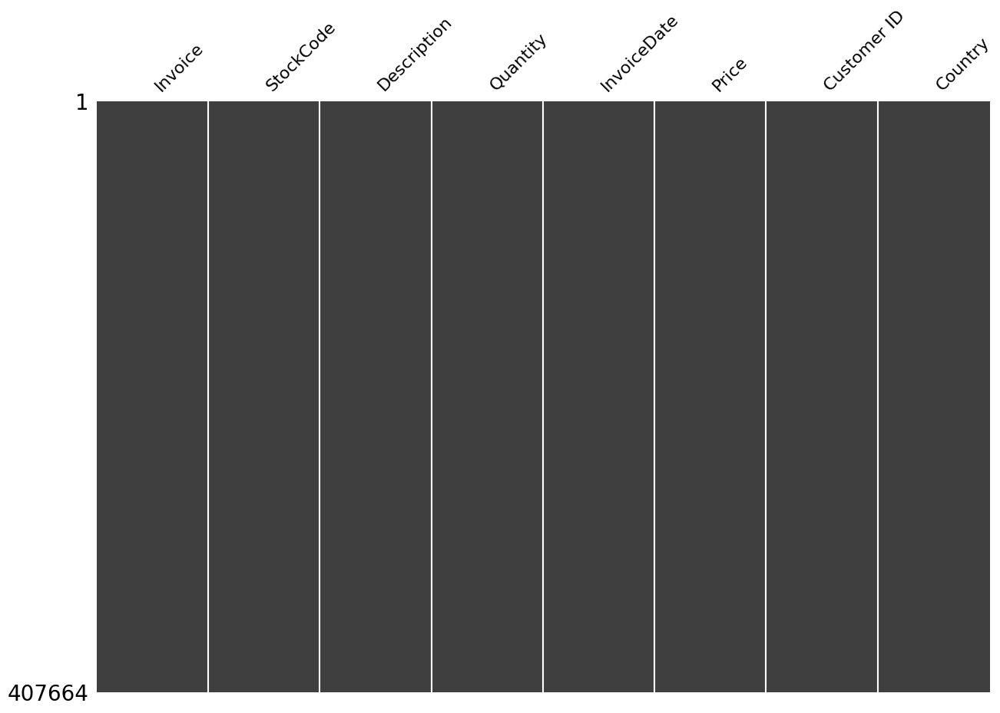

In [28]:
profile_df(df_limpio) 

###**Análisis Bivariado (variables numéricas)**:###

- Los gráficos siguen siendo muy parecidos a como eran antes, pero la única diferencia es que ahora los valores sí tienen sentido, es decir los valores para Price y Quantity no se vuelven negativos.

###**Análisis de Correlación de Pearson (variables numéricas)**:###

- Se sigue apreciando de la matriz de correlación de Pearson que las variables Quantity, InvoiceDate y Price no tienen una relación lineal (pues tienen valores cercanos a 0).

###**Análisis de Matriz de Datos Faltantes**:###

- De la nullity matrix se aprecia ahora sí que no hay valores nulos en ninguna variable (todos los datos que tenían valores nulos en la variable Customer ID fueron eliminados).

### 1.2.4 Obtención de TOPs [0.75 ptos]

Sin considerar los comentarios realizados en la sección 1.2 , *Don Mora* les pide obtener el **Top de 30 productos que generan más ganancias** para la tienda de retail. Deben considerar todo el registro temporal presente en el dataset y entregar la información en un gráfico de barras de los ingresos/cantidades v/s el nombre de los productos (Utilice `plotly`). ¿Los artículos más vendidos son los mismos que generan más ganancias?Comente los resultados obtenidos.

**Resultados:**

**Precio (precio unitario del producto en transacción) v/s Description (nombre del producto en transacción)**

Como el precio de cada producto fluctúa su valor en el tiempo, tenemos muchos datos en los que aparece el nombre del producto pero con diferentes precios (lo cual no nos sirve para hacer el Top 30 buscado).

Para poder hacer este análisis agruparemos los datos por Description (es decir por el nombre de cada producto) y consideraremos el precio promedio que tuvo ese producto en el tiempo, luego ordenaremos este dataframe en orden descendente según el precio y plotearemos el Top 30 buscado:

In [29]:
# Groupby descrito arriba
df_precio_promedio = df_limpio.groupby('Description')['Price'].mean().round(2).reset_index()

# Ordenamos dataframe según precio en orden descendente
df_precio_ordenado = df_precio_promedio.sort_values(by='Price', ascending=False)

# Obtenemos Top 30 buscado
df_top30_precio = df_precio_ordenado.head(30)

# Graficamos
fig = px.bar(
    data_frame = df_top30_precio,
    x = 'Description',
    y = 'Price'
)

fig.update_layout(
    title='Top 30 productos más caros (en promedio)',
    xaxis_title='Nombre del Producto',
    yaxis_title='Precio'
)

fig.show()

**Quantity (cantidades vendidas del producto en transacción) v/s Description (nombre del producto en transacción)**

Al igual que arriba, como las cantidades vendidas de cada producto en transacción fluctúan su valor en el tiempo, tenemos muchos datos en los que aparece el nombre del producto pero con diferentes cantidades (lo cual no nos sirve para hacer el Top 30 buscado).

Para poder hacer este análisis agruparemos los datos por Description (es decir por el nombre de cada producto) y consideraremos la cantidad promedio de ventas de ese producto en el tiempo, luego ordenaremos este dataframe en orden descendente según las cantidades vendidas y plotearemos el Top 30 buscado:

In [30]:
# Groupby descrito arriba
df_cantidad_promedio = df_limpio.groupby('Description')['Quantity'].mean().round(0).reset_index()

# Ordenamos dataframe según cantidad en orden descendente
df_cantidad_ordenado = df_cantidad_promedio.sort_values(by='Quantity', ascending=False)

# Obtenemos Top 30 buscado
df_top30_cantidad = df_cantidad_ordenado.head(30)

# Graficamos
fig = px.bar(
    data_frame = df_top30_cantidad,
    x = 'Description',
    y = 'Quantity'
)

fig.update_layout(
    title='Top 30 productos más vendidos (en promedio)',
    xaxis_title='Nombre del Producto',
    yaxis_title='Cantidad'
)

fig.show()

**Total Revenue (ganancia generada por el producto en transacción) v/s Description (nombre del producto en transacción)**

Ahora sí haremos el Top 30 de productos que generan más ganancias para la tienda de retail. Para ello uniremos los groupby de precio promedio y de cantidad promedio y haremos una nueva columna denominada Total Revenue (ganancia), la cual corresponde al producto de precio promedio con cantidad promedio:

In [31]:
# Merge descrito arriba
df_precio_cantidad = pd.merge(df_precio_promedio, df_cantidad_promedio, on='Description', how='inner')

# Nueva columna de ganancia
df_precio_cantidad['Total Revenue'] = df_precio_cantidad['Price'] * df_precio_cantidad['Quantity']

# Ordenamos dataframe según ganancia en orden descendente
df_precio_cantidad = df_precio_cantidad.sort_values(by='Total Revenue', ascending=False)

# Obtenemos Top 30 buscado
df_top30_ganancia = df_precio_cantidad.head(30)

# Graficamos
fig = px.bar(
    data_frame = df_top30_ganancia,
    x = 'Description',
    y = 'Total Revenue'
)

fig.update_layout(
    title='Top 30 productos que generan más ganancias (en promedio)',
    xaxis_title='Nombre del Producto',
    yaxis_title='Ganancia'
)

fig.show()

Veamos si hay intersección entre alguno de estos tres Top 30 (precio, cantidad y ganancia):

Precio y Cantidad:

In [32]:
interseccion1 = pd.merge(df_top30_precio, df_top30_cantidad, on='Description', how='inner')
interseccion1

,Description,Price,Quantity


Precio y Ganancia:

In [33]:
interseccion2 = pd.merge(df_top30_precio, df_top30_ganancia, on='Description', how='inner')
interseccion2

,Description,Price_x,Price_y,Quantity,Total Revenue
0,Manual,227.26,227.26,6.0,1363.56
1,BLUE KASHMIRI COFFEE TABLE,62.49,62.49,7.0,437.43
2,HALL CABINET WITH 3 DRAWERS,41.79,41.79,13.0,543.27
3,Discount,41.38,41.38,39.0,1613.82


Cantidad y Ganancia:

In [34]:
interseccion3 = pd.merge(df_top30_cantidad, df_top30_ganancia, on='Description', how='inner')
interseccion3

,Description,Quantity_x,Price,Quantity_y,Total Revenue
0,POP-ART FLUORESCENT PENS,3096.0,0.24,3096.0,743.04
1,SMALL FAIRY CAKE FRIDGE MAGNETS,2447.0,1.30,2447.0,3181.10
2,BLACK AND WHITE PAISLEY FLOWER MUG,1427.0,1.04,1427.0,1484.08
3,S/5 MINI ICE CREAM FRIDGE MAGNETS,996.0,0.88,996.0,876.48
4,ORANGE FLOWER MUG,898.0,1.06,898.0,951.88
5,SET/6 STRAWBERRY PAPER PLATES,711.0,0.80,711.0,568.80
6,BIRD IN TREE MUG,580.0,1.11,580.0,643.80
7,LARGE HANGING GLASS+ZINC LANTERN,560.0,1.60,560.0,896.00
8,ENGLISH ROSE EDWARDIAN PARASOL,505.0,3.00,505.0,1515.00
9,LARGE GLASS SUNDAE DISH CLEAR,498.0,1.40,498.0,697.20


En base a esto se concluye que:

- No hay ningún producto que se encuentre en el top 30 de precio y el top 30 de cantidades vendidas a la vez, lo cual quiere decir que los artículos más vendidos no son los más caros precisamente (lo cual es intuitivo).
- Hay 4 productos que se encuentran en el top 30 de precio y el top 30 de ganancia a la vez, lo cual refleja que en general los productos con alto precio no son en general los que generan más ganancias.
- Hay 14 productos que se encuentran en el top 30 de cantidad y el top 30 de ganancia a la vez, lo cual quiere decir que en general la mitad (pues 14 es casi la mitad de 30) de los productos que más se venden son los que generan más ganancias. 

### 1.2.5 Visualización del registro temporal [0,75 ptos]

El dueño del retail en su afán por saber más sobre los datos de su firma les solicita que grafiquen las ventas respecto al tiempo. Con esto les aclara que durante el día tienen muchas variaciones en sus ventas, por lo que les recomienda que consideren el registro temporal como `año-mes-día`. ¿Es posible observar datos extraños?, Comente lo que observa del gráfico.

In [37]:
def plot_ventas(dataframe):

  # Convertimos fecha (InvoiceDate) a formato año-mes-día
  dataframe['InvoiceDate'] = pd.to_datetime(dataframe['InvoiceDate'], format='%Y-%m-%d')
  
  # Ploteamos el histograma
  fig = px.histogram(
    data_frame = dataframe, 
    x = 'InvoiceDate'
  )

  fig.update_layout(
    title='Ventas respecto al tiempo (diariamente)',
    xaxis_title='Fecha',
    yaxis_title='Ventas'
  )

  fig.show()

In [38]:
plot_ventas(df_limpio)

Hay ciertos intervalos de tiempo (días) sin ventas (por ejemplo cerca de Jan 2010 entre Dec 23, 2009 y Jan 3, 2010). Se aprecia que a medida que pasa el tiempo las ventas tienden a aumentar hasta fines del 2010, pero siempre de manera volátil (a veces baja mucho y luego sube mucho), por lo que efectivamente se observan datos extraños.

# Conclusión
Eso ha sido todo para el lab de hoy, recuerden que el laboratorio tiene un plazo de entrega de una semana. Cualquier duda del laboratorio, no duden en contactarnos por mail o U-cursos.

![Gracias Totales!](https://i.pinimg.com/originals/65/ae/27/65ae270df87c3c4adcea997e48f60852.gif "bruno")


<br>
<center>
<img src="https://i.kym-cdn.com/photos/images/original/001/194/195/b18.png" width=100 height=50 />
</center>
<br>

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=87110296-876e-426f-b91d-aaf681223468' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>